<a href="https://colab.research.google.com/github/danielav081596/Proyecto_Integrador_Equipo5/blob/main/Proyecto_Salud_MNA_Base_Adultos.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


#**Instituto Tecnológico y de Estudios Superiores de Monterrey**

##**Maestría en Inteligencia Artificial Aplicada**

### TC5035.10 Proyecto Integrador - "Modelación y predicción del impacto de las experiencias benevolentes en la infancia en las Condiciones de Bienestar Emocional (BCEs) en niños y adultos mexicanos"


#### Dra. Grettel Barceló Alonso - Asesor del proyecto

*Avance 1. Análisis exploratorio de datos*


**Equipo # 5**
* Karla Daniela Valenzuela A00819192
* Emmanuel Domínguez Bravo A01793683

En este primer avance realizamos un análisis exploratorio de los datos (EDA - Exploratory Data Analysis) donde examinamos los datos disponibles para encontrar patrones, detectar anomalías así como aplicar técnicas estadísticas para verificar premisas (Suresh & Usman, 2020) que nos sirvan como referencia para aplicar y justificar operaciones de preprocesamiento, necesarias para la correcta implementación de los modelos de aprendizaje automático correspondientes.

En el presente trabajo tomamos la base de datos proporcionada que consideraremos como los datos de entrenamiento, que consisten en las respuestas de salida de encuestas realizadas a un grupo de adultos que presentan ciertas patologías psicológicas. Los datos etiquetados los estaremos utilizando para entrenar modelos de clasificación multi-clase y multi-salida que aplicados a un conjunto de datos separado de encuestas realizadas a un grupo de niños, clasificar si de acuerdo con sus experiencias negativas y positivas vividas hasta ahora, presentarán un riesgo de padecer alguna de las patologías presentadas en el grupo de adultos.

In [1]:
#!pip install pyreadstat

In [ ]:
# importamos las librerías requeridas

import numpy as np
import pandas as pd
#import pyreadstat
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [ ]:
# Leemos los archivos con extensión .sav que se nos proporcionaron
df_adultos, meta = pyreadstat.read_sav('/content/2.1.Base de ACES_Adultos.sav')
df_menores, meta = pyreadstat.read_sav('/content/2.2.Base de ACES_Menores.sav')

# Escribimos los datos en un archivo .csv
df_adultos.to_csv('ACEs Adultos.csv', index=False)

In [ ]:
# Creamos un dataframe del archivo .csv

df_adultos = pd.read_csv('ACEs Adultos.csv')


<ipython-input-192-b99c725b2965>:6: DtypeWarning: Columns (87,525,538,539,540) have mixed types. Specify dtype option on import or set low_memory=False.
  df_adultos = pd.read_csv('ACEs Adultos.csv')


In [ ]:
# La base de datos tiene 689 columnas. Con base en discusiones con los especialistas
# en el área procederemos a seleccionar aquellas que nos den información relevante

df_adultos.head()

,FOLIO,FOLIO2,ID_ADULTO,TELEFONO,CORREO,BINOMIO,FILTRO,ENT,ENTIDAD,MUN,...,EDAD,INDIGENA,RELIGION,ESCOLARIDAD,NSEF,NSE5F,UPM,RURAL,PONDERADOR,AREA
0,0100108639999001-01,0100108639999001-01,1.0,4.493858e+09,yeimider1@gmail.com,1,2,1,AGUASCALIENTES,1,...,26.0,2.0,1.0,2.0,3.0,5.0,1.00109E+11,1.0,18619.7832,1.0
1,0100108639999001-02,0100108639999001-02,3.0,4.495684e+09,NaN,0,2,1,AGUASCALIENTES,1,...,32.0,2.0,1.0,2.0,3.0,5.0,1.00109E+11,1.0,18619.7832,1.0
2,0100108639999001-03,0100108639999001-03,1.0,4.494059e+09,Betomartiez89@gmail.com,1,2,1,AGUASCALIENTES,1,...,30.0,2.0,1.0,2.0,3.0,5.0,1.00109E+11,1.0,18619.7832,1.0
3,0100108639999001-04,0100108639999001-04,1.0,4.496682e+09,NaN,1,2,1,AGUASCALIENTES,1,...,26.0,2.0,1.0,2.0,1.0,1.0,1.00109E+11,1.0,18619.7832,1.0
4,0100108639999001-05,0100108639999001-05,1.0,4.492521e+09,NaN,1,2,1,AGUASCALIENTES,1,...,32.0,2.0,1.0,2.0,2.0,3.0,1.00109E+11,1.0,18619.7832,1.0


In [ ]:
# Hacemos una revisión rápida de los tipos de datos

df_adultos.dtypes

FOLIO          object
FOLIO2         object
ID_ADULTO     float64
TELEFONO      float64
CORREO         object
               ...   
NSE5F         float64
UPM            object
RURAL         float64
PONDERADOR    float64
AREA          float64
Length: 689, dtype: object

In [ ]:
# datos numéricos

df_numeric_columns = df_adultos.select_dtypes(include=['int64', 'float64']).columns

df_numeric_columns

Index(['ID_ADULTO', 'TELEFONO', 'BINOMIO', 'FILTRO', 'ENT', 'MUN', 'LOC',
       'MZN', 'ECUESTADOR', 'MAQUINA',
       ...
       'SEXO', 'EDAD', 'INDIGENA', 'RELIGION', 'ESCOLARIDAD', 'NSEF', 'NSE5F',
       'RURAL', 'PONDERADOR', 'AREA'],
      dtype='object', length=657)

In [ ]:
# datos categóricos

df_categorical_columns = df_adultos.select_dtypes(exclude=['int64', 'float64']).columns

df_categorical_columns


Index(['FOLIO', 'FOLIO2', 'CORREO', 'ENTIDAD', 'MUNICIPIO', 'LOCALIDAD',
       'AGEB', 'AD_M07_10E', 'AD_M07_25A', 'AD_M09_96_16_1', 'AD_M09_96_E',
       'AD_M09_104_16_E', 'AD_M09_104_22_E', 'AD_M09_114_01', 'AD_M13_122',
       'AD_M03_03', 'AD_M03_04', 'AD_M03_05', 'AD_M03_06', 'FOLIO_COMP$01',
       'FOLIO_COMP$02', 'FOLIO_COMP$03', 'FOLIO_COMP$04', 'FOLIO_COMP$05',
       'FOLIO_COMP$06', 'FOLIO_COMP$07', 'FOLIO_COMP$08', 'FOLIO_COMP$09',
       'FOLIO_COMP$10', 'FOLIO_COMP$11', 'FOLIO_COMP$12', 'UPM'],
      dtype='object')

In [ ]:
# Renombramos columnas para facilitar su identificación

columns_to_rename = {'AD_M05_02': 'Situación Laboral', 'AD_M05_05': 'Religiosidad', 'AD_M05_01': 'Estado Civil', 'AD_M05_06':'Estudios padres', 'AD_M06_03':'Ocupación','AD_M06_04':'Educación','AD_M07_23':'Rango salarial','AD_M07_24':'Servicio de salud','AD_M07_49':"Seguridad alimentaria 1",
                     'AD_M07_50':"Seguridad alimentaria 2",'AD_M07_51':"Seguridad alimentaria 3",'AD_M07_52':"Seguridad alimentaria 4",
                     'AD_M07_53':"Seguridad alimentaria 5",'AD_M07_54':"Seguridad alimentaria 6",'AD_M07_55':"Seguridad alimentaria 7",
                     'AD_M09_95_01_1':"comportamiento_riesgo 1",'AD_M09_95_01_2':"comportamiento_riesgo 2",'AD_M09_95_01_3':"comportamiento_riesgo 3",'AD_M09_95_01_4':"comportamiento_riesgo 4",
                     'AD_M09_95_02_1':"comportamiento_riesgo 5",'AD_M09_95_02_2':"comportamiento_riesgo 6",'AD_M09_95_02_3':"comportamiento_riesgo 7",'AD_M09_95_02_4':"comportamiento_riesgo 8",
                     'AD_M09_95_03_1':"comportamiento_riesgo 9",'AD_M09_95_03_2':"comportamiento_riesgo 10",'AD_M09_95_03_3':"comportamiento_riesgo 11",'AD_M09_95_03_4':"comportamiento_riesgo 12",
                     'AD_M09_95_04_1':"comportamiento_riesgo 13",'AD_M09_95_04_2':"comportamiento_riesgo 14",'AD_M09_95_04_3':"comportamiento_riesgo 15",'AD_M09_95_04_4':"comportamiento_riesgo 16",
                     'AD_M09_95_05_1':"comportamiento_riesgo 17",'AD_M09_95_05_2':"comportamiento_riesgo 18",'AD_M09_95_05_3':"comportamiento_riesgo 19",'AD_M09_95_05_4':"comportamiento_riesgo 20",
                     'AD_M09_95_06_1':"comportamiento_riesgo 21",'AD_M09_95_06_2':"comportamiento_riesgo 22",'AD_M09_95_06_3':"comportamiento_riesgo 23",'AD_M09_95_06_4':"comportamiento_riesgo 24",
                     'AD_M09_96_01_1':"Depresión",'AD_M09_96_02_1':"Trastorno Bipolar",'AD_M09_96_03_1':"Ezquizofrenia",'AD_M09_96_04_1':"Estrés postrauma",
                     'AD_M09_96_05_1':"Anorexia Nerviosa",'AD_M09_96_06_1':"Bulimia Nerviosa",'AD_M09_96_07_1':"Ansiedad_encuesta", 'AD_M09_96_08_1':'TRASTORNO_LÍMITE_PERSONALIDAD',
                     'AD_M09_96_09_1':"Ideación Suicida",'AD_M09_96_10_1':"AUTOLESIONES NO SUICIDAS",'AD_M09_96_11_1':"DÉFICIT_ATENCIÓN_HIPERACTIVIDAD",'AD_M09_96_12_1':"Alcoholismo",
                     'AD_M09_96_13_1':"Consumo_Sustancias",'AD_M09_96_14_1':"Autismo",'AD_M09_96_15_1':"Otro Trastorno",'AD_M09_97_01':"Síntomas_trastornos_1",'AD_M09_97_02':"Síntomas_trastornos_2",
                     'AD_M09_97_03':"Síntomas_trastornos_3",'AD_M09_97_04':"Síntomas_trastornos_4",'AD_M09_97_05':"Síntomas_trastornos_5",'AD_M09_97_02':"Síntomas_trastornos_2"}

df_adultos = df_adultos.rename(columns=columns_to_rename)


In [ ]:
# List of columns to rename - Positive experiences
positive_att = {'AD_M10_115_01': 'Exp_pos_1','AD_M10_115_02': 'Exp_pos_2','AD_M10_115_03': 'Exp_pos_3','AD_M10_115_04': 'Exp_pos_4','AD_M10_115_05': 'Exp_pos_5',
                'AD_M10_115_06': 'Exp_pos_6','AD_M10_115_07': 'Exp_pos_7','AD_M10_115_08': 'Exp_pos_8','AD_M10_115_09': 'Exp_pos_9','AD_M10_115_10': 'Exp_pos_10',
                'AD_M10_116_01': 'Exp_pos_11','AD_M10_116_02': 'Exp_pos_12','AD_M10_116_03': 'Exp_pos_13','AD_M10_116_04': 'Exp_pos_14','AD_M10_116_05': 'Exp_pos_15',
                'AD_M10_116_06': 'Exp_pos_16','AD_M10_116_07': 'Exp_pos_17','AD_M11_117': 'Bienestar_1','AD_M11_118': 'Bienestar_2','AD_M12_120_01': 'Co_social_1',
                'AD_M12_120_02': 'Co_social_2','AD_M12_120_03': 'Co_social_3','AD_M12_120_04': 'Co_social_4','AD_M12_120_05': 'Co_social_5','AD_M12_120_06': 'Co_social_6',
                'AD_M12_120_07': 'Co_social_7','AD_M12_120_08': 'Co_social_8','AD_M12_120_09': 'Co_social_9','AD_M12_120_10': 'Co_social_10','AD_M12_120_11': 'Co_social_11',
                'AD_M12_120_12': 'Co_social_12','AD_M12_120_13': 'Co_social_13','AD_M12_120_14': 'Co_social_14','AD_M12_120_15': 'Co_social_15','AD_M12_120_16': 'Co_social_16'}

In [ ]:
# Renombramos las columnas
df_adultos = df_adultos.rename(columns=positive_att)

In [ ]:
# Creamos un nuevo data frame con columnas que deseamos investigar como datos de entrada

col_list = ['Exp_pos_1','Exp_pos_2','Exp_pos_3','Exp_pos_4','Exp_pos_5',
                'Exp_pos_6','Exp_pos_7','Exp_pos_8','Exp_pos_9','Exp_pos_10',
                'Exp_pos_11','Exp_pos_12','Exp_pos_13','Exp_pos_14','Exp_pos_15',
                'Exp_pos_16','Exp_pos_17','Bienestar_1','Bienestar_2','Co_social_1',
                'Co_social_2','Co_social_3','Co_social_4','Co_social_5','Co_social_6',
                'Co_social_7','Co_social_8','Co_social_9','Co_social_10','Co_social_11',
                'Co_social_12','Co_social_13','Co_social_14','Co_social_15','Co_social_16']

df_adultos_new = pd.DataFrame(df_adultos, columns=col_list)

In [ ]:
df_adultos_new.columns

Index(['Exp_pos_1', 'Exp_pos_2', 'Exp_pos_3', 'Exp_pos_4', 'Exp_pos_5',
       'Exp_pos_6', 'Exp_pos_7', 'Exp_pos_8', 'Exp_pos_9', 'Exp_pos_10',
       'Exp_pos_11', 'Exp_pos_12', 'Exp_pos_13', 'Exp_pos_14', 'Exp_pos_15',
       'Exp_pos_16', 'Exp_pos_17', 'Bienestar_1', 'Bienestar_2', 'Co_social_1',
       'Co_social_2', 'Co_social_3', 'Co_social_4', 'Co_social_5',
       'Co_social_6', 'Co_social_7', 'Co_social_8', 'Co_social_9',
       'Co_social_10', 'Co_social_11', 'Co_social_12', 'Co_social_13',
       'Co_social_14', 'Co_social_15', 'Co_social_16'],
      dtype='object')

In [ ]:
# Agregamos columnas de datos generales complementarios

col_grales = ['SEXO','EDAD','INDIGENA','Situación Laboral', 'Religiosidad', 'Estado Civil','Estudios padres', 'Ocupación','ESCOLARIDAD',
              'Rango salarial','Servicio de salud',"NIV_SEG","AREA"]

df_adultos_new[col_grales]=df_adultos[col_grales]

In [ ]:
# Agregamos las respuestas de experiencias negativas (ACEs)
ACES = ['ACE1','ACE2','ACE3','ACE4','ACE5','ACE6','ACE7','ACE8','ACE9','ACE10','ACE11','ACE12','ACE13','ACE_mas_4','PuntajeACES']

ACES_orig_name = ['Indicador01','Indicador02','Indicador03','Indicador04','Indicador05','Indicador06',
                  'Indicador07','Indicador08','Indicador09','Indicador10','Indicador11','Indicador12',
                  'Indicador13','IndicadorMas4','PuntajeACES']
df_adultos_new[ACES]=df_adultos[ACES_orig_name]

In [ ]:
#Agregamos las métricas de experiencias positivas aplicadas por los analistas a los encuestados

metrics = ['EX_BENEVOLENTES','FORTALEZAS','FELICIDAD','PROSOCIALIDAD','SUM_TOTAL']
df_adultos_new[metrics]=df_adultos[metrics]
df_adultos_new.rename(columns={'SUM_TOTAL':'SUM_EX_POS'},inplace=True)

In [ ]:
# Renombramos la columna 'NIV_SEG'
df_adultos_new.rename(columns={'NIV_SEG':'NIV_SEG_ALIMENTARIA'}, inplace=True)

In [ ]:
# Renombramos las variables dependientes

y_train_col = {'DxPHQ9':'Depresion', 'DxGAD7':'Ansiedad','DxPCL5':'TRANSTORNO_ESTRES POSTRAUMÁTICO','Dx_SCOFF':'SOSPECHA DE ANOREXIA/BULIMIA'}


df_adultos.rename(columns=y_train_col, inplace=True)


In [ ]:
diag_lst = ['Depresion', 'Ansiedad','TRANSTORNO_ESTRES POSTRAUMÁTICO','SOSPECHA DE ANOREXIA/BULIMIA']

df_adultos_new[diag_lst]=df_adultos[diag_lst]

In [ ]:
df_adultos_new.columns

Index(['Exp_pos_1', 'Exp_pos_2', 'Exp_pos_3', 'Exp_pos_4', 'Exp_pos_5',
       'Exp_pos_6', 'Exp_pos_7', 'Exp_pos_8', 'Exp_pos_9', 'Exp_pos_10',
       'Exp_pos_11', 'Exp_pos_12', 'Exp_pos_13', 'Exp_pos_14', 'Exp_pos_15',
       'Exp_pos_16', 'Exp_pos_17', 'Bienestar_1', 'Bienestar_2', 'Co_social_1',
       'Co_social_2', 'Co_social_3', 'Co_social_4', 'Co_social_5',
       'Co_social_6', 'Co_social_7', 'Co_social_8', 'Co_social_9',
       'Co_social_10', 'Co_social_11', 'Co_social_12', 'Co_social_13',
       'Co_social_14', 'Co_social_15', 'Co_social_16', 'SEXO', 'EDAD',
       'INDIGENA', 'Situación Laboral', 'Religiosidad', 'Estado Civil',
       'Estudios padres', 'Ocupación', 'ESCOLARIDAD', 'Rango salarial',
       'Servicio de salud', 'NIV_SEG_ALIMENTARIA', 'AREA', 'ACE1', 'ACE2',
       'ACE3', 'ACE4', 'ACE5', 'ACE6', 'ACE7', 'ACE8', 'ACE9', 'ACE10',
       'ACE11', 'ACE12', 'ACE13', 'ACE_mas_4', 'PuntajeACES',
       'EX_BENEVOLENTES', 'FORTALEZAS', 'FELICIDAD', 'PROSOCIALIDAD',

In [ ]:
# Definimos nuestro conjunto de datos de salida etiquetados

y_train = df_adultos_new[['Depresion', 'Ansiedad',
       'TRANSTORNO_ESTRES POSTRAUMÁTICO', 'SOSPECHA DE ANOREXIA/BULIMIA']]

In [ ]:
# Y nuestro conjunto de datos de entrada etiquetados

x_train = df_adultos_new.drop(columns=['Depresion', 'Ansiedad',
       'TRANSTORNO_ESTRES POSTRAUMÁTICO', 'SOSPECHA DE ANOREXIA/BULIMIA'])

In [ ]:
x_train.columns

Index(['Exp_pos_1', 'Exp_pos_2', 'Exp_pos_3', 'Exp_pos_4', 'Exp_pos_5',
       'Exp_pos_6', 'Exp_pos_7', 'Exp_pos_8', 'Exp_pos_9', 'Exp_pos_10',
       'Exp_pos_11', 'Exp_pos_12', 'Exp_pos_13', 'Exp_pos_14', 'Exp_pos_15',
       'Exp_pos_16', 'Exp_pos_17', 'Bienestar_1', 'Bienestar_2', 'Co_social_1',
       'Co_social_2', 'Co_social_3', 'Co_social_4', 'Co_social_5',
       'Co_social_6', 'Co_social_7', 'Co_social_8', 'Co_social_9',
       'Co_social_10', 'Co_social_11', 'Co_social_12', 'Co_social_13',
       'Co_social_14', 'Co_social_15', 'Co_social_16', 'SEXO', 'EDAD',
       'INDIGENA', 'Situación Laboral', 'Religiosidad', 'Estado Civil',
       'Estudios padres', 'Ocupación', 'ESCOLARIDAD', 'Rango salarial',
       'Servicio de salud', 'NIV_SEG_ALIMENTARIA', 'AREA', 'ACE1', 'ACE2',
       'ACE3', 'ACE4', 'ACE5', 'ACE6', 'ACE7', 'ACE8', 'ACE9', 'ACE10',
       'ACE11', 'ACE12', 'ACE13', 'ACE_mas_4', 'PuntajeACES',
       'EX_BENEVOLENTES', 'FORTALEZAS', 'FELICIDAD', 'PROSOCIALIDAD',

In [ ]:
y_train.columns

Index(['Depresion', 'Ansiedad', 'TRANSTORNO_ESTRES POSTRAUMÁTICO',
       'SOSPECHA DE ANOREXIA/BULIMIA'],
      dtype='object')

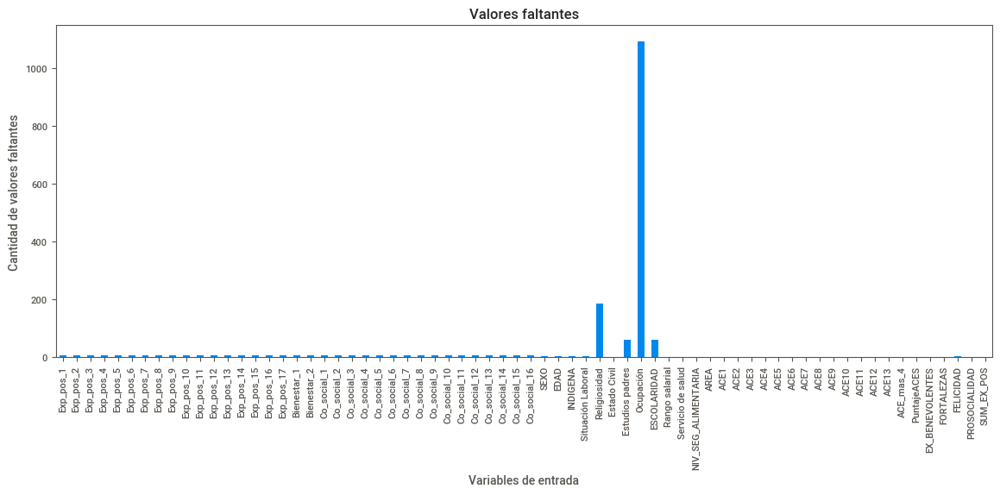

In [ ]:
# Calculamos la cantidad de valores faltantes por sexo
valores_faltantes_por_sexo = x_train.apply(lambda x: x.isnull().sum())

# Creamos una gráfica de barras con el conteo de los valores faltantes
valores_faltantes_por_sexo.plot(kind='bar', stacked=False,fontsize=8,rot=90,figsize=(14,5))
plt.title('Valores faltantes',fontsize=12)
plt.xlabel('Variables de entrada',fontsize=10)
plt.ylabel('Cantidad de valores faltantes',fontsize=10)
plt.show()

In [ ]:
# Revisamos los % de valores faltantes por columna
faltantes = (pd.isnull(x_train).sum()/x_train.shape[0])*100
faltantes = faltantes.sort_values(ascending=False)
faltantes

ESCOLARIDAD        4.087193
Estudios padres    4.087193
Exp_pos_1          0.544959
Co_social_9        0.544959
Co_social_3        0.544959
                     ...   
ACE4               0.000000
ACE3               0.000000
ACE2               0.000000
ACE1               0.000000
SUM_EX_POS         0.000000
Length: 66, dtype: float64

In [ ]:
# Eliminamos las columnas con mayor número de valores faltantes, Ocupación y Religiosidad
# en nuestro dataframe de variables de entrada:

x_train.drop(columns=['Ocupación', 'Religiosidad'], inplace=True)

In [ ]:
# Calculamos los faltantes nuevamente, podemos seguir trabajando con Escolaridad
# y Estudios de padres, ya que no presentan una cantidad significativa de faltantes

faltantes = (pd.isnull(x_train).sum()/x_train.shape[0])*100
faltantes = faltantes.sort_values(ascending=False)
faltantes

ESCOLARIDAD        4.087193
Estudios padres    4.087193
Exp_pos_1          0.544959
Co_social_9        0.544959
Co_social_3        0.544959
                     ...   
ACE4               0.000000
ACE3               0.000000
ACE2               0.000000
ACE1               0.000000
SUM_EX_POS         0.000000
Length: 66, dtype: float64

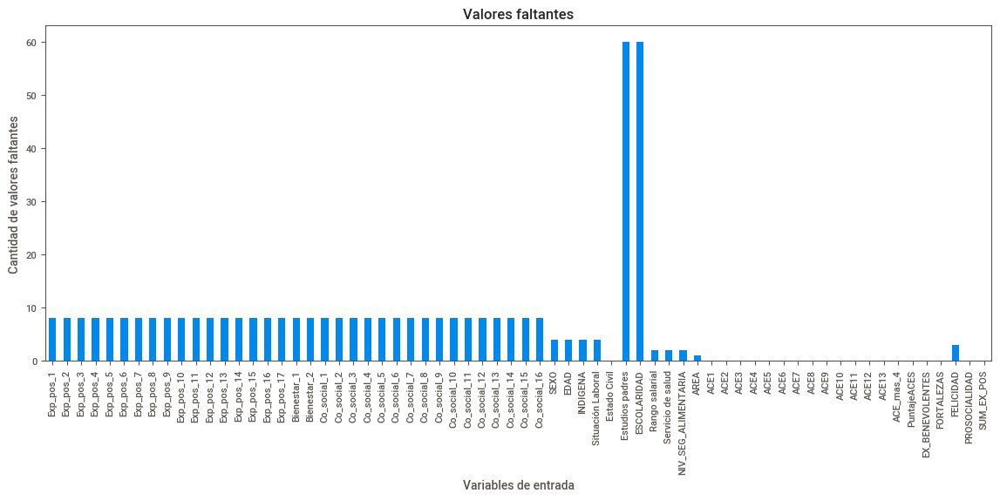

In [ ]:
# Revisamos nuevamente la gráfica de valores faltantes:

valores_faltantes_por_sexo = x_train.apply(lambda x: x.isnull().sum())

# Creamos la gráfica de barras
valores_faltantes_por_sexo.plot(kind='bar', stacked=False,fontsize=8,rot=90,figsize=(14,5))
plt.title('Valores faltantes',fontsize=12)
plt.xlabel('Variables de entrada',fontsize=10)
plt.ylabel('Cantidad de valores faltantes',fontsize=10)
plt.show()

In [ ]:
# Generamos un resumen estadístico de las variables de entrada

x_train.describe()

,Exp_pos_1,Exp_pos_2,Exp_pos_3,Exp_pos_4,Exp_pos_5,Exp_pos_6,Exp_pos_7,Exp_pos_8,Exp_pos_9,Exp_pos_10,...,ACE11,ACE12,ACE13,ACE_mas_4,PuntajeACES,EX_BENEVOLENTES,FORTALEZAS,FELICIDAD,PROSOCIALIDAD,SUM_EX_POS
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,...,1468.000000,1468.000000,1468.000000,1468.000000,1468.000000,1468.000000,1468.000000,1465.000000,1468.000000,1468.000000
mean,1.099315,1.249315,1.260959,1.136301,1.378082,1.152055,1.233562,1.223288,1.116438,1.179452,...,0.075613,0.098093,0.023842,0.225477,0.880790,7.927793,21.631471,5.587713,57.982289,2.585831
std,0.299187,0.432765,0.439308,0.343226,0.485074,0.359197,0.423241,0.416592,0.320860,0.383862,...,0.264468,0.297541,0.152609,0.418038,0.324146,2.070395,7.288000,1.468006,14.788524,3.599609
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,7.000000,18.000000,5.000000,48.000000,0.000000
50%,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,8.000000,24.000000,6.000000,60.000000,1.000000
75%,1.000000,1.000000,2.000000,1.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,10.000000,28.000000,7.000000,70.000000,4.000000
max,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,10.000000,28.000000,8.000000,80.000000,15.000000


In [ ]:
"""Visualizamos los tipos de caracteres. A pesar de ser tipo flotante o enteros,
por la naturaleza de la información la mayoría son datos de tipo categórico.
Solamente PROSOCIALIDAD y SUM_EXP_POS serán considerados como numéricos, ya que
son métricas acumuladas de las encuestas realizadas"""

x_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1468 entries, 0 to 1467
Data columns (total 66 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Exp_pos_1            1460 non-null   float64
 1   Exp_pos_2            1460 non-null   float64
 2   Exp_pos_3            1460 non-null   float64
 3   Exp_pos_4            1460 non-null   float64
 4   Exp_pos_5            1460 non-null   float64
 5   Exp_pos_6            1460 non-null   float64
 6   Exp_pos_7            1460 non-null   float64
 7   Exp_pos_8            1460 non-null   float64
 8   Exp_pos_9            1460 non-null   float64
 9   Exp_pos_10           1460 non-null   float64
 10  Exp_pos_11           1460 non-null   float64
 11  Exp_pos_12           1460 non-null   float64
 12  Exp_pos_13           1460 non-null   float64
 13  Exp_pos_14           1460 non-null   float64
 14  Exp_pos_15           1460 non-null   float64
 15  Exp_pos_16           1460 non-null   f

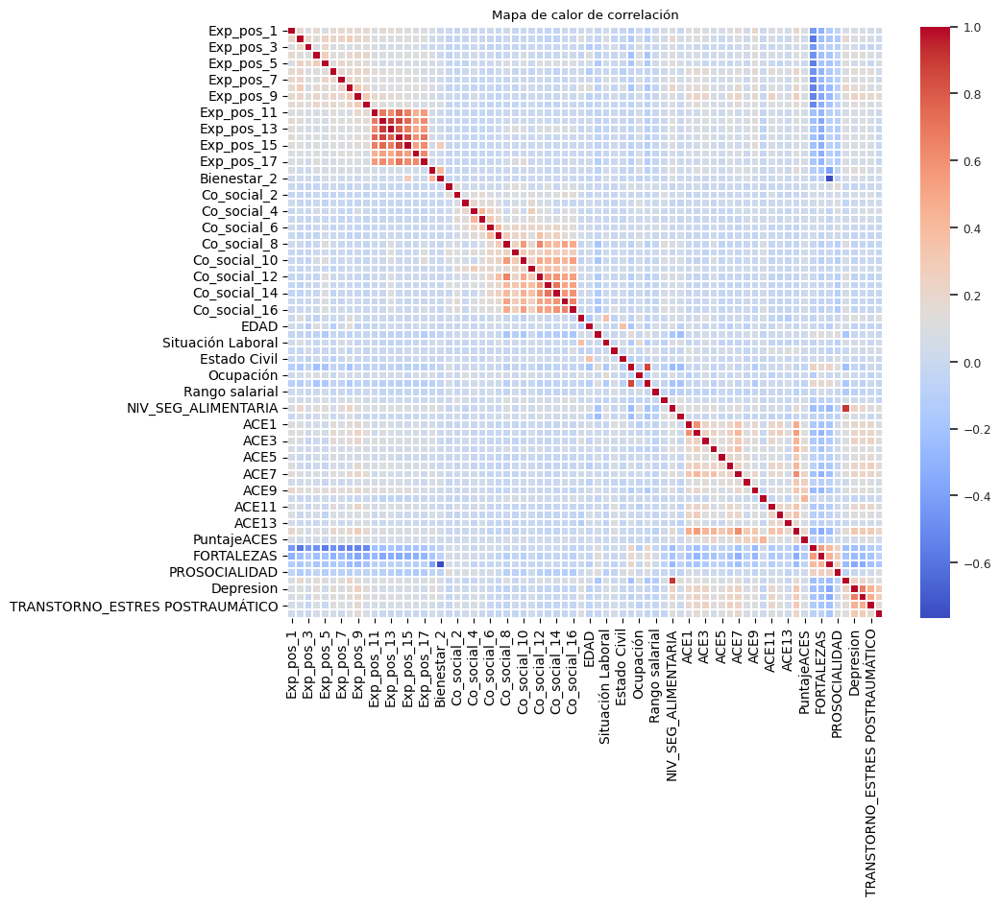

In [ ]:

# Calculamos la matriz de correlación
correlation_matrix = df_adultos_new.corr(method='pearson')

# Creamos un mapa de calor de la matriz de correlación

fig, ax = plt.subplots(figsize=(10, 8))
sns.set(font_scale=0.8)
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', linewidths=.05)
plt.title('Mapa de calor de correlación')
plt.show()


De la matriz de correlación vemos que las experiencias positivas tienen cierta correlación negativa con las experiencias adversas, sin embargo uno de los objetivos de nuestro proyecto es ponderar cuáles de las experiencias positivas tienen un mayor efecto de mitigación de las patologías etiquetadas. Así mismo, pudimos notar que entre mayor inseguridad alimentaria se tiene (NIV_SEG_ALIMENTARIA), hay una clara correlación con el trastorno de depresión. Por otro lado, inicialmente asumíamos que una mayor cohesión social (Co_social) tendría cierto beneficio para redicir las enfermedades psicológicas, pero no se puede identificar ninguna correlación claramente.

A continuación utilizamos Pandas Profiling como una herramienta automática para realizar el análisis EDA, sin embargo seleccionaremos un sub-conjunto de datos, ya que los recursos de cómputo con los que contamos en Google Colab son limitados.

In [ ]:
#!pip install ydata_profiling --upgrade

In [ ]:
#pip install pandas-profiling

In [ ]:
#!pip install typing_extensions

In [ ]:
# probamos con un subset de datos más pequeño para correrlo en Pandas Profiling
df_adultos_new.drop(columns=['INDIGENA', 'Situación Laboral', 'Religiosidad', 'Estado Civil',
       'Estudios padres', 'Ocupación', 'ESCOLARIDAD', 'Rango salarial',
       'Servicio de salud','ACE1', 'ACE2', 'ACE3', 'ACE4', 'ACE5',
       'ACE6', 'ACE7', 'ACE8', 'ACE9', 'ACE10', 'ACE11', 'ACE12', 'ACE13',
       'ACE_mas_4', 'PuntajeACES','Co_social_1', 'Co_social_2', 'Co_social_3', 'Co_social_4',
       'Co_social_5', 'Co_social_6', 'Co_social_7', 'Co_social_8',
       'Co_social_9', 'Co_social_10', 'Co_social_11', 'Co_social_12',
       'Co_social_13', 'Co_social_14', 'Co_social_15', 'Co_social_16'],inplace=True)

In [ ]:
df_adultos_new.columns

Index(['Exp_pos_1', 'Exp_pos_2', 'Exp_pos_3', 'Exp_pos_4', 'Exp_pos_5',
       'Exp_pos_6', 'Exp_pos_7', 'Exp_pos_8', 'Exp_pos_9', 'Exp_pos_10',
       'Exp_pos_11', 'Exp_pos_12', 'Exp_pos_13', 'Exp_pos_14', 'Exp_pos_15',
       'Exp_pos_16', 'Exp_pos_17', 'Bienestar_1', 'Bienestar_2', 'SEXO',
       'EDAD', 'NIV_SEG_ALIMENTARIA', 'AREA', 'EX_BENEVOLENTES', 'FORTALEZAS',
       'FELICIDAD', 'PROSOCIALIDAD', 'SUM_EX_POS', 'Depresion', 'Ansiedad',
       'TRANSTORNO_ESTRES POSTRAUMÁTICO', 'SOSPECHA DE ANOREXIA/BULIMIA'],
      dtype='object')

In [ ]:
from ydata_profiling import ProfileReport
#from pandas_profiling import ProfileReport


report = ProfileReport(df_adultos_new)

report.to_notebook_iframe()



Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Del análisis automático realizado por Pandas Profiling, vemos que las variables de salida están claramente desbalanceadas, teniendo una mayor concentración de datos en los grados moderados de las enfermedades en todos los casos. Podemos ver que las severidades ascienden en magnitud en las categorías etiquetadas (1 a 5), por lo que será necesario convertir dichas categorías en variables separadas para facilitar su procesamiento al asignar la clase a predecir, de manera que tendremos múltiples variables de salida.

En el análisis bivariable que realiza vemos que la Prosocialidad aumenta a partir de los 30 años de edad y es prácticamente nula en edades más tempranas. También vemos que las experiencias positivas se dan desde los 8 ó 10 años de edad,contribuyendo a una mayor percepción de felicidad por los encuestados.

In [ ]:
# Análisis multivariable: creamos gráficas Pair Plot para un sub-conjunto
# de variables de entrada y salida:

VARS = ['Bienestar_1', 'Bienestar_2','NIV_SEG_ALIMENTARIA',
        'Depresion', 'Ansiedad',
       'TRANSTORNO_ESTRES POSTRAUMÁTICO', 'SOSPECHA DE ANOREXIA/BULIMIA']

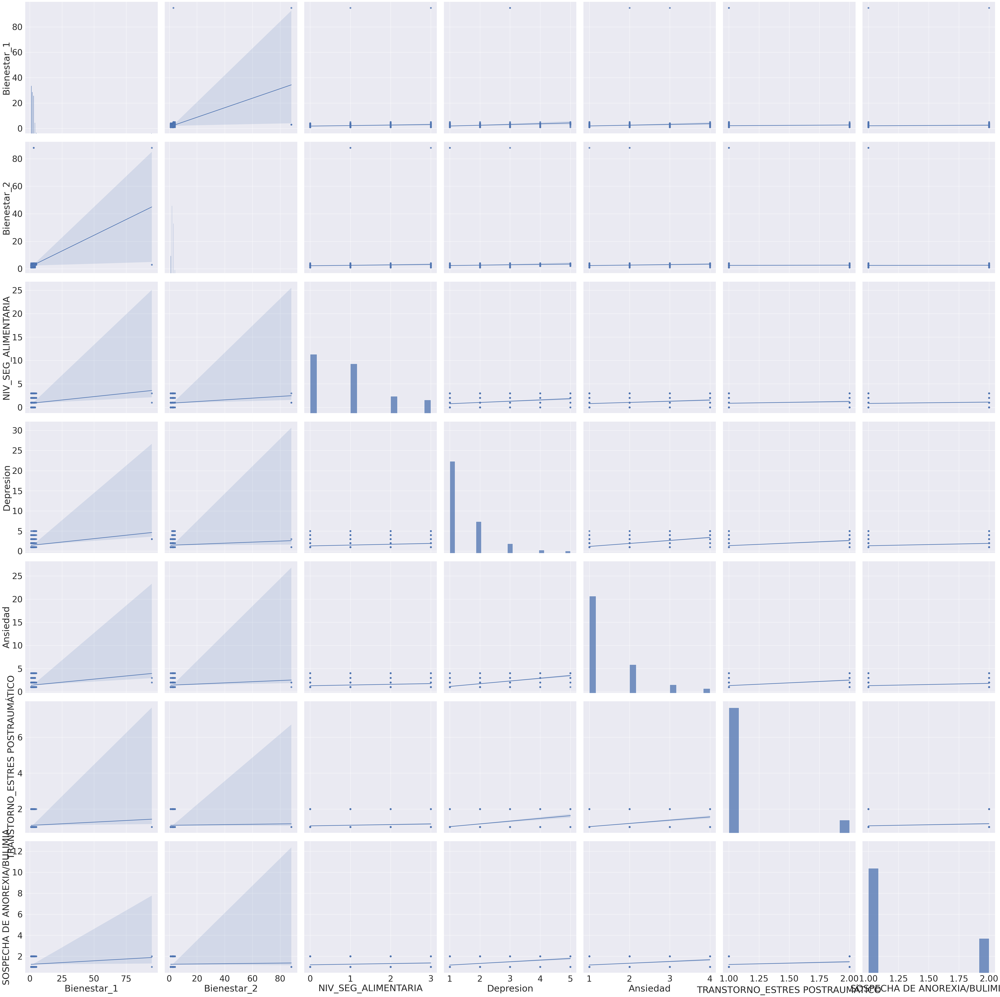

In [ ]:
# Gráfica pair plot, vemos en la diagonal los histogramas que reflejan las
# diferentes categorías por variable.

sns.set(font_scale=3)

sns.pairplot(df_adultos_new,vars = VARS, kind="reg",height=8)
#fig, ax = plt.subplots(figsize=(20, 20))
plt.show()

In [ ]:
# imputamos la media para los valores numéricos faltantes y la moda para los categóricos.

# Identificamos las columnas numéricas y categóricas
numeric_columns = x_train.select_dtypes(include=np.number).columns
categorical_columns = x_train.select_dtypes(include='object').columns

# Imputamos la mediana para valores numéricos
for col in numeric_columns:
    median_value = x_train[col].median()
    x_train[col].fillna(median_value, inplace=True)

# Imputamos la moda para valores categóricos
for col in categorical_columns:
    mode_value = x_train[col].mode()[0]
    x_train[col].fillna(mode_value, inplace=True)


In [ ]:
# Revisamos nuevamente los % de valores faltantes por columna
# vemos que ya no hay valores faltantes
faltantes = (pd.isnull(x_train).sum()/x_train.shape[0])*100
faltantes

Exp_pos_1          0.0
Exp_pos_2          0.0
Exp_pos_3          0.0
Exp_pos_4          0.0
Exp_pos_5          0.0
                  ... 
EX_BENEVOLENTES    0.0
FORTALEZAS         0.0
FELICIDAD          0.0
PROSOCIALIDAD      0.0
SUM_EX_POS         0.0
Length: 66, dtype: float64

In [ ]:
numeric_columns = x_train.select_dtypes(include=['int64', 'float64']).columns

numeric_columns

Index(['Exp_pos_1', 'Exp_pos_2', 'Exp_pos_3', 'Exp_pos_4', 'Exp_pos_5',
       'Exp_pos_6', 'Exp_pos_7', 'Exp_pos_8', 'Exp_pos_9', 'Exp_pos_10',
       'Exp_pos_11', 'Exp_pos_12', 'Exp_pos_13', 'Exp_pos_14', 'Exp_pos_15',
       'Exp_pos_16', 'Exp_pos_17', 'Bienestar_1', 'Bienestar_2', 'Co_social_1',
       'Co_social_2', 'Co_social_3', 'Co_social_4', 'Co_social_5',
       'Co_social_6', 'Co_social_7', 'Co_social_8', 'Co_social_9',
       'Co_social_10', 'Co_social_11', 'Co_social_12', 'Co_social_13',
       'Co_social_14', 'Co_social_15', 'Co_social_16', 'SEXO', 'EDAD',
       'INDIGENA', 'Situación Laboral', 'Estado Civil', 'Estudios padres',
       'ESCOLARIDAD', 'Rango salarial', 'Servicio de salud',
       'NIV_SEG_ALIMENTARIA', 'AREA', 'ACE1', 'ACE2', 'ACE3', 'ACE4', 'ACE5',
       'ACE6', 'ACE7', 'ACE8', 'ACE9', 'ACE10', 'ACE11', 'ACE12', 'ACE13',
       'ACE_mas_4', 'PuntajeACES', 'EX_BENEVOLENTES', 'FORTALEZAS',
       'FELICIDAD', 'PROSOCIALIDAD', 'SUM_EX_POS'],
      dtype='

In [ ]:
# Seleccionamos las columnas categóricas

df_categorical_columns = x_train.select_dtypes(exclude=['int64', 'float64']).columns

df_categorical_columns


Index([], dtype='object')

In [ ]:
# Seleccionamos las columnas categóricas que reflejen experiencias positivas para
# determinar si mitigan los efectos negativos de las experiencias adversas.

categorical_columns = ['Exp_pos_1', 'Exp_pos_2', 'Exp_pos_3', 'Exp_pos_4', 'Exp_pos_5',
       'Exp_pos_6', 'Exp_pos_7', 'Exp_pos_8', 'Exp_pos_9', 'Exp_pos_10',
       'Exp_pos_11', 'Exp_pos_12', 'Exp_pos_13', 'Exp_pos_14', 'Exp_pos_15',
       'Exp_pos_16', 'Exp_pos_17', 'Bienestar_1', 'Bienestar_2', 'Co_social_1',
       'Co_social_2', 'Co_social_3', 'Co_social_4', 'Co_social_5',
       'Co_social_6', 'Co_social_7', 'Co_social_8', 'Co_social_9',
       'Co_social_10', 'Co_social_11', 'Co_social_12', 'Co_social_13',
       'Co_social_14', 'Co_social_15', 'Co_social_16', 'SEXO', 'EDAD',
       'INDIGENA', 'Situación Laboral', 'Estado Civil', 'Estudios padres',
       'ESCOLARIDAD', 'Rango salarial', 'Servicio de salud',
       'NIV_SEG_ALIMENTARIA', 'AREA', 'ACE1', 'ACE2', 'ACE3', 'ACE4', 'ACE5',
       'ACE6', 'ACE7', 'ACE8', 'ACE9', 'ACE10', 'ACE11', 'ACE12', 'ACE13',
       'ACE_mas_4', 'PuntajeACES', 'EX_BENEVOLENTES', 'FORTALEZAS',
       'FELICIDAD', 'PROSOCIALIDAD', 'SUM_EX_POS']

In [ ]:
# Mostramos las columnas con mayor cardinalidad

x_train.iloc[:,61:-2].describe()

,EX_BENEVOLENTES,FORTALEZAS,FELICIDAD
count,25.0,25.0,25.000000
mean,10.0,28.0,6.360000
std,0.0,0.0,0.907377
min,10.0,28.0,5.000000
25%,10.0,28.0,6.000000
50%,10.0,28.0,6.000000
75%,10.0,28.0,7.000000
max,10.0,28.0,8.000000


In [ ]:
# Definimos una función para utilizar una frecuencia mínima de ocurrencia
# para reducir el número de categorías para las variables con alta cardinalidad

from collections import Counter

def cumulatively_categorise(column,threshold=0.6,return_categories_list=True):
  #Find the threshold value using the percentage and number of instances in the column
  threshold_value=int(threshold*len(column))
  #Initialise an empty list for our new minimised categories
  categories_list=[]
  #Initialise a variable to calculate the sum of frequencies
  s=0
  #Create a counter dictionary of the form unique_value: frequency
  counts=Counter(column)

  #Loop through the category name and its corresponding frequency after sorting the categories by descending order of frequency
  for i,j in counts.most_common():
    #Add the frequency to the global sum
    s+=dict(counts)[i]
    #Append the category name to the list
    categories_list.append(i)
    #Check if the global sum has reached the threshold value, if so break the loop
    if s>=threshold_value:
      break
  #Append the category Other to the list
  categories_list.append(0)

  #Replace all instances not in our new categories by Other
  new_column=column.apply(lambda x: x if x in categories_list else 0)

  #Return transformed column and unique values if return_categories=True
  if(return_categories_list):
    return new_column,categories_list
  #Return only the transformed column if return_categories=False
  else:
    return new_column

In [ ]:
# Hacemos una prueba en una columna del data frame
x_train['FORTALEZAS'] = df_adultos['FORTALEZAS'].copy()

In [ ]:
# Llamamos la función y verificamos resultados
transformed_column,new_category_list=cumulatively_categorise(col_test['FORTALEZAS'],return_categories_list=True)


In [ ]:
# Vemos que el número de categorías redujo de 28 a 8
col_test = pd.DataFrame(col_test)
col_test.describe()

,FORTALEZAS
count,1468
unique,8
top,Other
freq,526


In [ ]:
# Aplicamos la función definida anteriormente en columnas de alta cardinalidad

for col in x_train:
    # One-hot encoding si la cardinalidad es baja (menos de 10 categorías únicas)
    if x_train[col].nunique() < 10:
        data_cleaned = pd.get_dummies(x_train, columns=[col], drop_first=True)
    else:
        # Para simplificar, en este caso solo eliminaremos las columnas con alta cardinalidad
        transformed_column,new_category_list = cumulatively_categorise(x_train[col],return_categories_list=True)
        data_cleaned[col] = pd.DataFrame(transformed_column)
# Verificar los cambios realizados
data_cleaned.describe()

,Exp_pos_1,Exp_pos_2,Exp_pos_3,Exp_pos_4,Exp_pos_5,Exp_pos_6,Exp_pos_7,Exp_pos_8,Exp_pos_9,Exp_pos_10,...,PROSOCIALIDAD,SUM_EX_POS,FELICIDAD_1.0,FELICIDAD_2.0,FELICIDAD_3.0,FELICIDAD_4.0,FELICIDAD_5.0,FELICIDAD_6.0,FELICIDAD_7.0,FELICIDAD_8.0
count,1468.000000,1468.000000,1468.000000,1468.000000,1468.000000,1468.000000,1468.000000,1468.000000,1468.000000,1468.000000,...,1468.000000,1468.000000,1468.000000,1468.000000,1468.000000,1468.000000,1468.000000,1468.000000,1468.000000,1468.000000
mean,1.098774,1.247956,1.259537,1.135559,1.376022,1.151226,1.232289,1.222071,1.115804,1.178474,...,38.008174,0.309946,0.001362,0.012262,0.059946,0.160763,0.195504,0.260899,0.233651,0.070163
std,0.298460,0.431974,0.438530,0.342436,0.484551,0.358391,0.422436,0.415780,0.320099,0.383042,...,31.932913,0.611175,0.036898,0.110089,0.237467,0.367437,0.396723,0.439275,0.423297,0.255509
min,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,51.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,1.000000,2.000000,1.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,66.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
max,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,...,80.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
data_cleaned.head()

,Exp_pos_1,Exp_pos_2,Exp_pos_3,Exp_pos_4,Exp_pos_5,Exp_pos_6,Exp_pos_7,Exp_pos_8,Exp_pos_9,Exp_pos_10,...,PROSOCIALIDAD,SUM_EX_POS,FELICIDAD_1.0,FELICIDAD_2.0,FELICIDAD_3.0,FELICIDAD_4.0,FELICIDAD_5.0,FELICIDAD_6.0,FELICIDAD_7.0,FELICIDAD_8.0
0,2.0,1.0,1.0,2.0,1.0,2.0,1.0,1.0,1.0,2.0,...,0,0,0,0,0,0,1,0,0,0
1,1.0,1.0,2.0,1.0,2.0,1.0,2.0,2.0,1.0,1.0,...,55,0,0,0,0,1,0,0,0,0
2,1.0,1.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,...,66,0,0,0,0,0,0,1,0,0
3,1.0,1.0,1.0,1.0,2.0,1.0,1.0,1.0,1.0,1.0,...,0,0,0,0,0,0,0,0,1,0
4,1.0,2.0,2.0,2.0,2.0,1.0,1.0,1.0,1.0,1.0,...,0,0,0,0,0,0,0,1,0,0


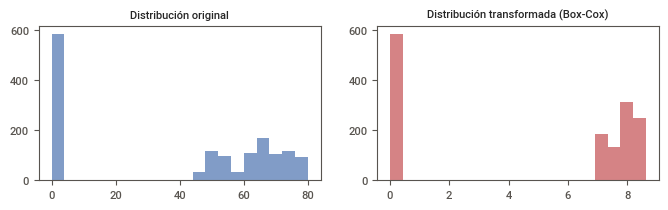

In [ ]:
from scipy.stats import boxcox

''' Aplicamos las transformaciones sobre variables numéricas con sesgo
en su histograma. En este caso, solo la aplicaremos a PROCOCIALIDAD y
'SUM_EX_POS', ya que todas las demás son categóricas'''

# Columnas a transformar
original_data = data_cleaned['PROSOCIALIDAD']

# Aplicar la transformación de Box-Cox
transformed_data, lambda_value = boxcox(original_data + 1)  # Se suma 1 para manejar valores no positivos

# CreaMOS histogramas para comparar la distribución antes y después de la transformación
fig, axs = plt.subplots(1, 2, figsize=(8, 2))
axs[0].hist(original_data, bins=20, color='b', alpha=0.7)
axs[0].set_title('Distribución original', fontsize = 8 )
axs[1].hist(transformed_data, bins=20, color='r', alpha=0.7)
axs[1].set_title('Distribución transformada (Box-Cox)', fontsize = 8)
plt.show()

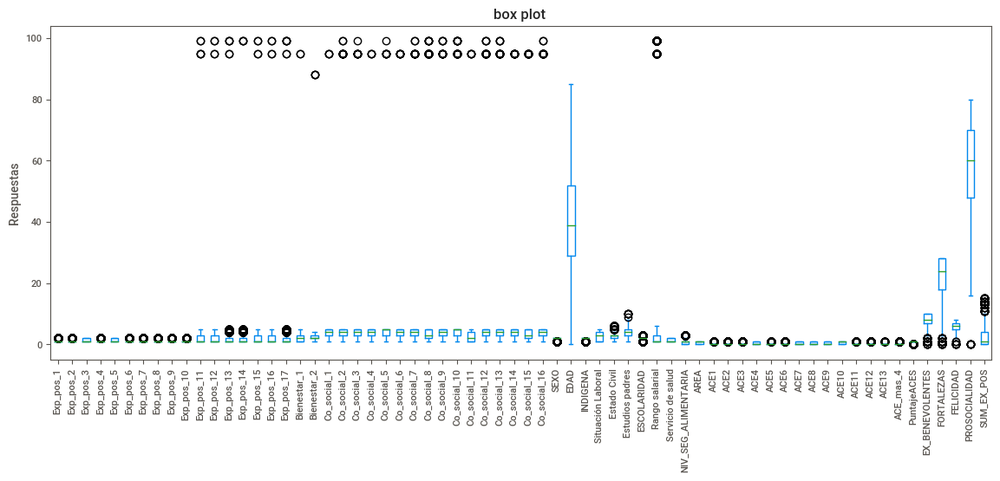

In [ ]:
# Visualizamos los datos de entrada atípicos con una gráfica tipo Box-Plot

x_train.plot(kind='box',fontsize=8,rot=90,figsize=(14,5))
plt.title('box plot ', fontsize=12)
plt.ylabel('Respuestas', fontsize=10)
plt.show()

In [ ]:
# Removemos outliers
# Iteramos a través de cada columna
for col in x_train.columns:
    if pd.api.types.is_numeric_dtype(x_train[col]):  # Verificar si la columna es de tipo numérico
        Q1 = x_train[col].quantile(0.25)
        Q3 = x_train[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        x_train = x_train[(x_train[col] >= lower_bound) & (x_train[col] <= upper_bound)]

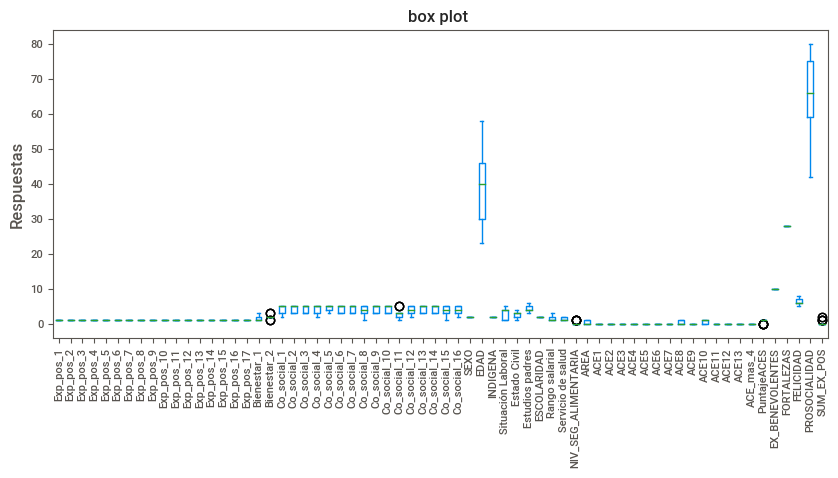

In [ ]:
# Verificamos con gráfica box ploit nuevamente:

x_train.plot(kind='box',fontsize=8,rot=90,figsize=(10,4))
plt.title('box plot ',fontsize=12)
plt.ylabel('Respuestas',fontsize=12)
plt.show()

En general, consideramos que la información después del pre-procesamiento es de una calidad aceptable para utilizarla en modelos de aprendizaje automático, considerando que algunas columnas reflejan la valoración que hicieron los expertos en la materia sobre el diagnóstico objetivo de las patologías etiquetadas después de analizar las respuestas proporcionadas por los encuestados.

Finalmente, debido a que se trata de datos categóricos en su mayoría, no consideramos que se tengan que normalizar, ya que necesitamos que cada categoría se conserve con su magnitud original para entender la importancia de cada variable en el resultado final.


**Referencias:**

Mukhiya, S. K., & Ahmed, U. (2020). *Hands-On Exploratory Data Analysis with Python*. Packt Publishing.

Sangani, R. (2021). *Dealing with features that have high cardinality*. Towards Data Science. https://towardsdatascience.com/dealing-with-features-that-have-high-cardinality-1c9212d7ff1b